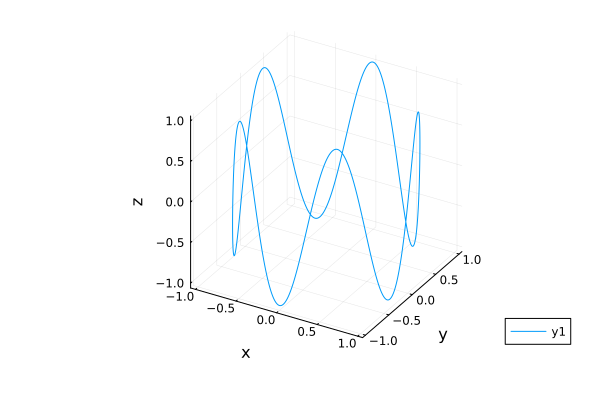

In [3]:
using Plots
# параметрическое уравнение:
t = range(0, stop=10, length=1000)
x = cos.(t)
y = sin.(t)
z = sin.(5t)
# построение графика:
plot(x, y, z, xlabel="x", ylabel="y", zlabel="z")

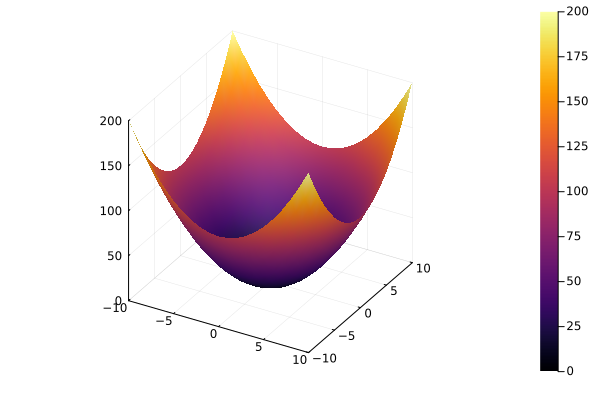

In [7]:
# построение графика поверхности:
f(x, y) = x^2 + y^2
x = -10:10
y = x
surface(x, y, f)

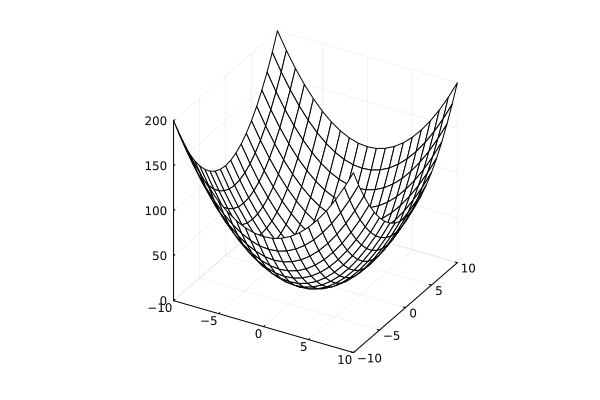

In [8]:
# построение графика поверхности:
f(x, y) = x^2 + y^2
x = -10:10
y = x
plot(x, y, f, linetype = :wireframe)

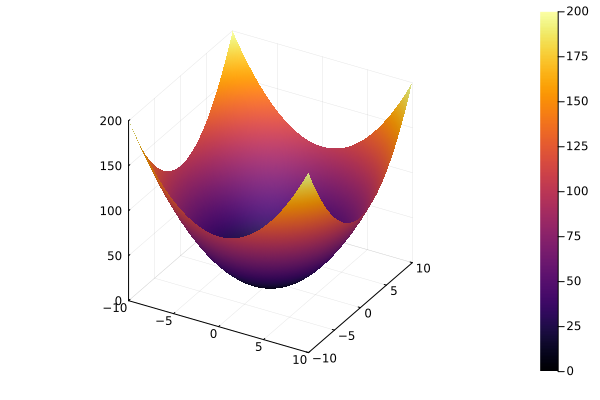

In [10]:
# параметры сглаживания
f(x, y) = x^2 + y^2
x = -10:0.1:10
y = x
plot(x, y, f, linetype = :surface)

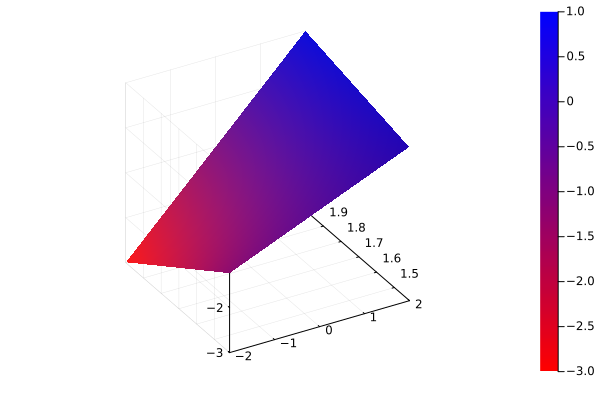

In [12]:
# задание угла зрения
x = range(-2, stop=2, length=100)
y = range(sqrt(2), stop=2, length=100)
f(x, y) = x * y - x - y + 1
plot(x, y, f,
    linetype = :surface,
    c = cgrad([:red, :blue]),
    camera = (-30, 30),
)

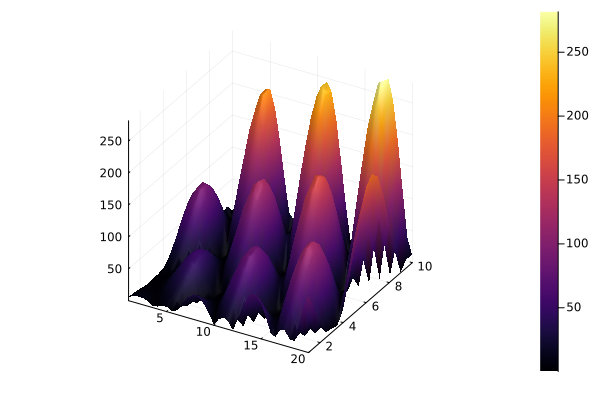

In [13]:
x = 1:0.5:20
y = 1:0.5:10
g(x, y) = (3x + y ^ 2) * abs(sin(x) + cos(y))
plot(x, y, g,
    linetype = :surface,
)

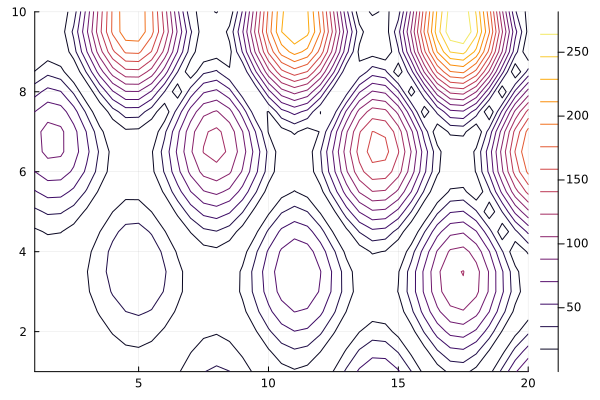

In [14]:
# Использование проекции значений исходной функции на плоскости для
# построения линий уровня
contour(x, y, g)

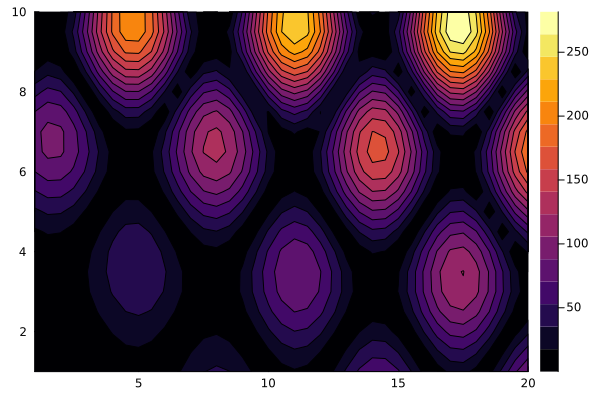

In [15]:
# добавление заливки цветом
p = contour(x, y, g, fill = true)
plot(p)

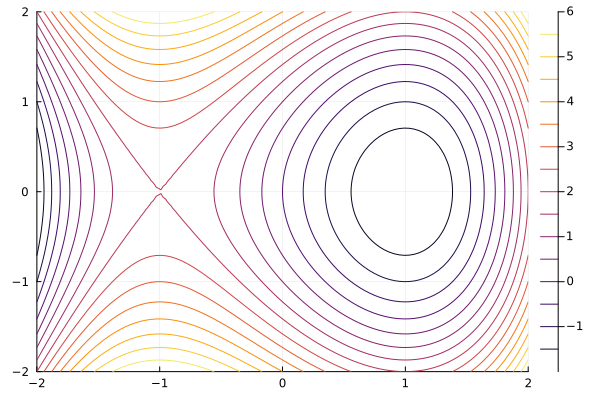

In [17]:
# определение переменных:
X = range(-2, stop=2, length=100)
Y = range(-2, stop=2, length=100)
# определение функции:
h(x, y) = x^3 - 3x + y^2
# построение поверхности:
plot(X, Y, h, linetype = :surface)
# построение линии уровня
contour(X, Y, h)

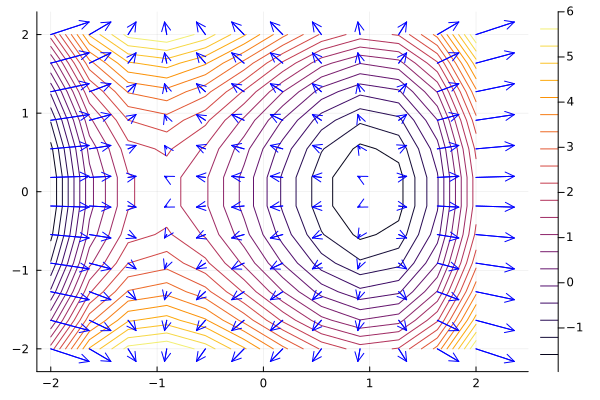

In [23]:
# градиент:
x = range(-2, stop=2, length=12)
y = range(-2, stop=2, length=12)
# определение функции:
h(x, y) = x^3 - 3x + y^2
# производная от исходной функции:
dh(x, y) = (3x^2 - 3)/25, (2y)/25
# построение линии уровня
p = contour(x, y, h, levels=20, fill=false)
xs = range(-2, stop=2, length=12)
ys = range(-2, stop=2, length=12)
Xq = vec([x for x in xs, y in ys])
Yq = vec([y for x in xs, y in ys])
# построение векторного поля:
quiver!(Xq, Yq, quiver=dh, c=:blue)

In [24]:
pyplot()

[ Info: Precompiling PyPlot [d330b81b-6aea-500a-939a-2ce795aea3ee] (cache misses: wrong dep version loaded (2))


Plots.PyPlotBackend()

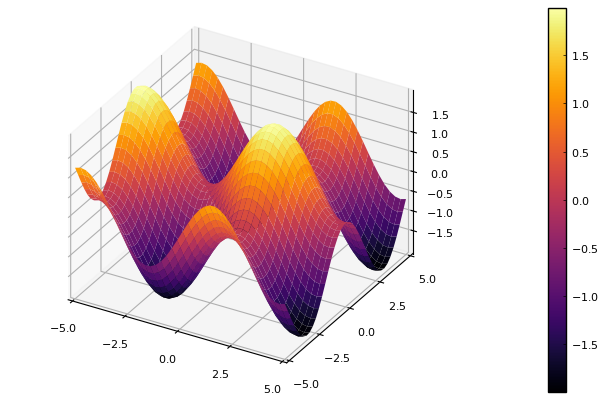

In [25]:
# построение поверхности
i = 0
X = Y = range(-5, stop=5, length=40)
surface(X, Y, (x, y) -> sin(x+10sin(i))+cos(y))

[ Info: Saved animation to /home/aeaskerov/programming/julia/lab5/tmp.gif


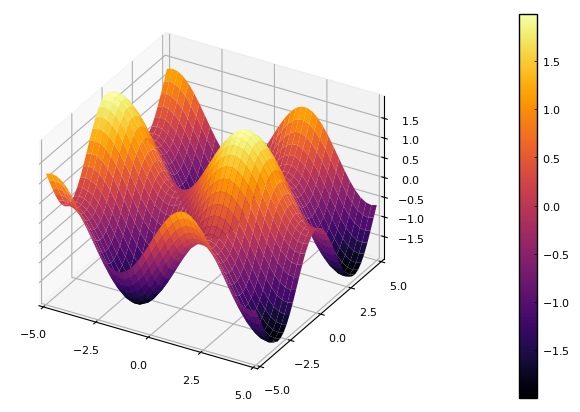

Plots.AnimatedGif("/home/aeaskerov/programming/julia/lab5/tmp.gif")
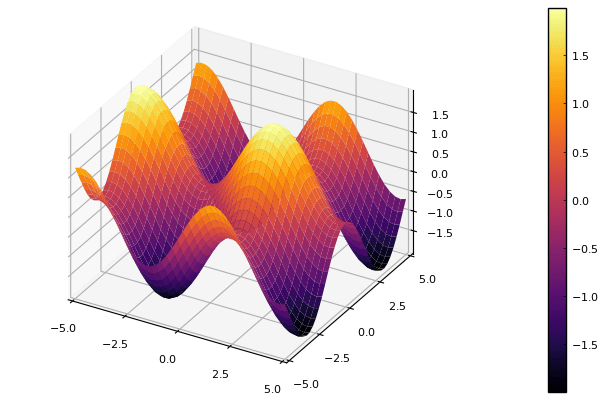

In [26]:
# анимация
X = Y = range(-5, stop=5, length=40)
@gif for i in range(0, stop=2pi, length=100)
    surface(X, Y, (x, y) -> sin(x+10sin(i))+cos(y))
end

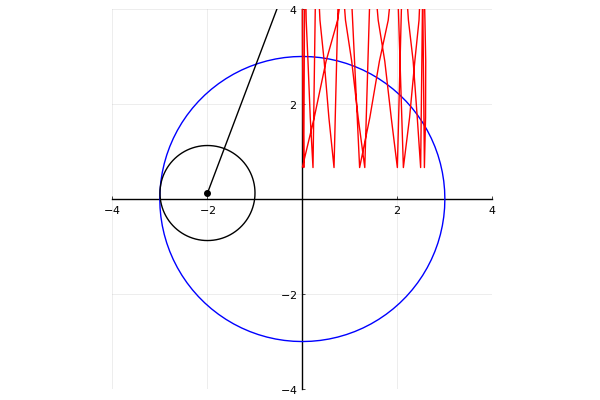

In [45]:
# построение гипоциклоиды
# радиус малой окружности:
r = 1
# коэффицент для построения большой окружности:
k = 3
# число отсчётов:
n = 100
# массив значений угла theta:
# theta from 0 to 2pi ( + a little extra)
th = collect(0:2*pi/100:2*pi+2*pi/100)
# массивы значений координат:
X = r*k*cos.(th)
Y = r*k*sin.(th)
# задаём оси координат
plt=plot(5, xlim = (-4, 4), ylim = (-4, 4), c = :red, aspect_ratio = 1,
    legend = false, framestyle = :origin)
# построим большую окружность
plot!(plt, X, Y, c = :blue, legend = false)
# частичное построение гипоциклоиды
i = 50
t = th[1:i]
# гипоциклоида
x = r*(k-1)*cos.(t) + r*cos.((k-1)*t)
x = r*(k-1)*sin.(t) + r*sin.((k-1)*t)
plot!(x, y, c = :red)
# малая окружность
xc = r*(k-1)*cos(t[end]) .+ r*cos.(th)
yc = r*(k-1)*sin(t[end]) .+ r*sin.(th)
plot!(xc, yc, c = :black)
# радиус малой окружности
xl = transpose([r*(k-1)*cos(t[end]) x[end]])
yl = transpose([r*(k-1)*sin(t[end]) y[end]])
plot!(xl, yl, markershape = :circle, markersize=4, 
    c = :black)
scatter!([x[end]], [y[end]], c = :red, markerstrokecolor = :red)

[ Info: Saved animation to /home/aeaskerov/programming/julia/lab5/hypocycloid.gif


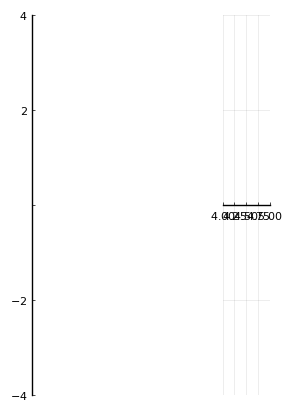

Plots.AnimatedGif("/home/aeaskerov/programming/julia/lab5/hypocycloid.gif")
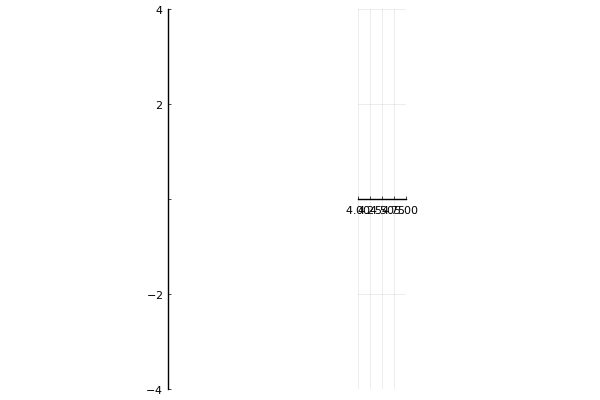

In [35]:
anim = @animate for i in 1:n
    # задаём оси координат:
    plt = plot(5, xlim=(4,-4),ylim=(-4,4), c = :red,
        aspect_ratio = 1, legend = false, framestyle = :origin)
    # большая окружность:
    plot!(plt, X, Y, c = :blue, legend = false)
    t = th[1:i]
    # гипоциклоида:
    x = r*(k-1)*cos.(t) + r*cos.((k-1)*t)
    y = r*(k-1)*sin.(t) + r*sin.((k-1)*t)
    plot!(x, y, c = :red)
    # малая окружность
    xc = r*(k-1)*cos(t[end]) .+ r*cos.(th)
    yc = r*(k-1)*sin(t[end]) .+ r*sin.(th)
    # радиус малой окружности
    xl = transpose([r*(k-1)*cos(t[end]) x[end]])
    yl = transpose([r*(k-1)*sin(t[end]) y[end]])
    plot!(xl, yl, markershape = :circle, markersize=4, 
    c = :black)
    scatter!([x[end]], [y[end]], c = :red, markerstrokecolor = :red)
end
gif(anim, "hypocycloid.gif")

In [36]:
# подключение пакета Statistics:
import Pkg
Pkg.add("Statistics")
using Statistics

   Resolving package versions...
  No Changes to `~/.julia/environments/v1.11/Project.toml`
  No Changes to `~/.julia/environments/v1.11/Manifest.toml`


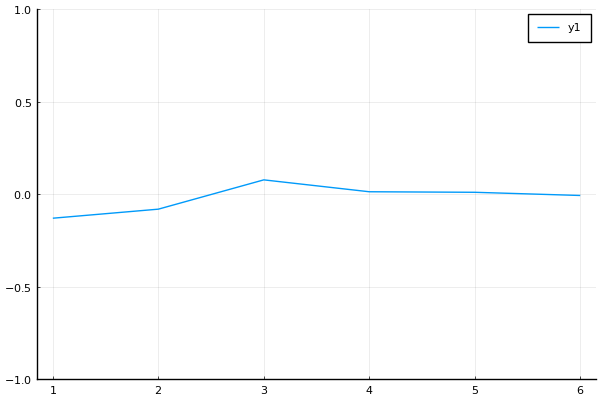

In [38]:
# массив значений
sds = [1, 1/2, 1/4, 1/8, 1/16, 1/32]
# сгенерируем массив ошибок (отклонений от исходных значений):
n = 10
y = [mean(sd*randn(n)) for sd in sds]
errs = 1.96 * sds / sqrt(n)
# график исходных значений
plot(y, ylims = (-1, 1))


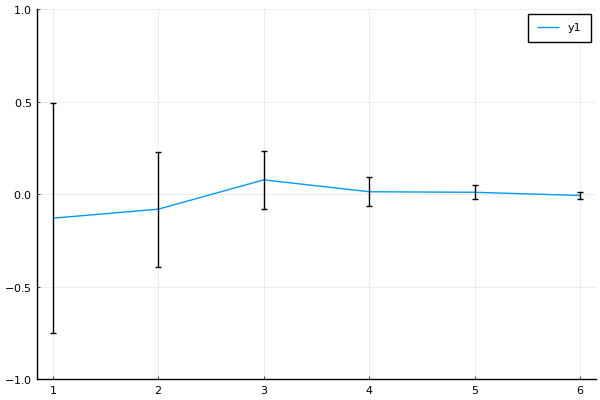

sys:1: UserWarning: You passed a edgecolor/edgecolors ((0.0, 0.0, 0.0, 1.0)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.


In [39]:
# график отклонений от исходных значений
plot(y, ylims = (-1, 1), err = errs)

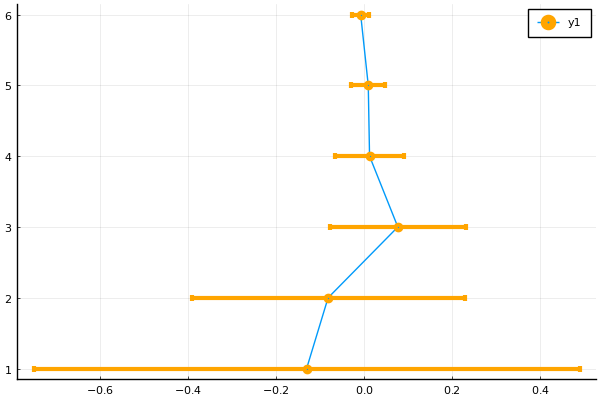

sys:1: UserWarning: You passed a edgecolor/edgecolors ((1.0, 0.6470588235294118, 0.0, 1.0)) for an unfilled marker ('|').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.


In [41]:
# повернём график
plot(y, 1:length(y),
    xerr = errs,
    marker = stroke(3, :orange)
)

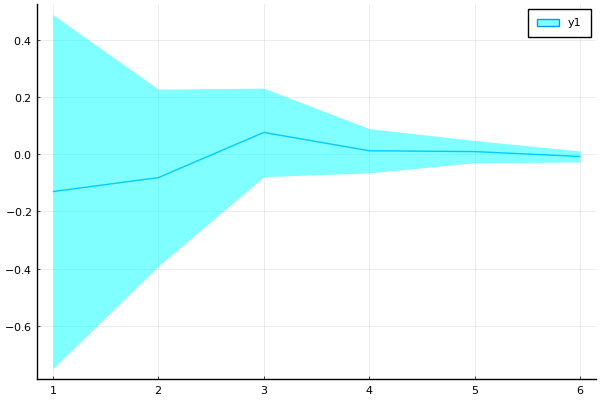

In [42]:
# заполним область цветом
plot(y, ribbon=errs, fill=:cyan)

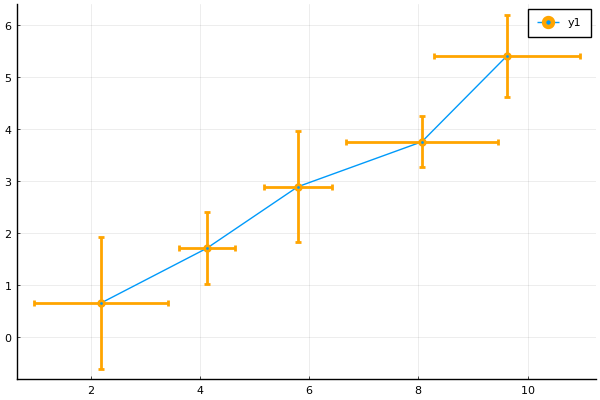

sys:1: UserWarning: You passed a edgecolor/edgecolors ((1.0, 0.6470588235294118, 0.0, 1.0)) for an unfilled marker ('_').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.


In [43]:
# график ошибок по двум осям
n = 10
x = [(rand()+1) .* randn(n) .+ 2i for i in 1:5]
y = [(rand()+1) .* randn(n) .+ i for i in 1:5]
f(v) = 1.96std(v) / sqrt(n)
xerr = map(f, x)
yerr = map(f, y)
x = map(mean, x)
y = map(mean, y)
plot(x, y, xerr = xerr, yerr = yerr, marker = stroke(2, :orange))

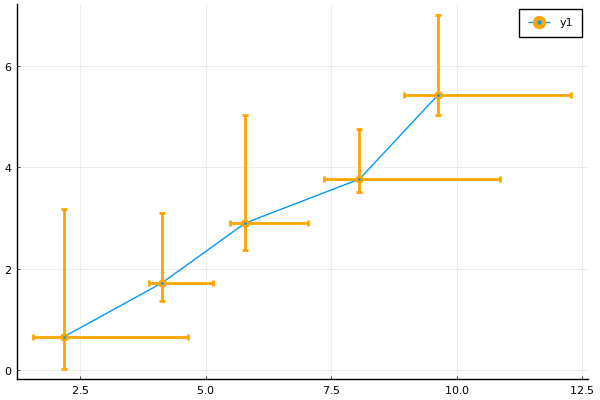

In [44]:
plot(x, y,
    xerr = (0.5xerr, 2xerr),
    yerr = (0.5yerr, 2yerr),
    marker = stroke(2, :orange)
)